<a href="https://colab.research.google.com/github/flydragon2018/colab_notebooks/blob/main/colab_yoloR_p6_w6_one_more_yolo_on_kaggle_train.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Train YoloR on COTS dataset (PART 1 - TRAINING) - as easy as possible to help people start with YoloR and develop this notebook
This notebook introduces YOLOR on Kaggle and TensorFlow - Help Protect the Great Barrier Reef competition. It shows how to train custom object detection model (COTS dataset) using YoloR. It could be good starting point for build own custom model based on YoloR detector. Full github repository you can find here - [YOLOR](https://github.com/WongKinYiu/yolor)

Steps covered in this notebook:

* Prepare COTS dataset for YoloR training
* Install YoloR (YoloR, MISH CUDA, pytorch_wavelets)
* Download Pre-Trained Weights for YoloR HUB
* Prepare configuration files (YoloR hyperparameters and dataset)
* Weights and Biases configuration for training logging
* YoloR training
* Run YoloR inference on test images

<div class="alert alert-warning">I found that there is no reference custom model training YoloR notebook on Kaggle. Since we have such an opportunity this is my contribution to this competition. Feel free to use it and enjoy! I really appreciate if you upvote this notebook. Thank you!</div>

<div class="alert alert-success" role="alert">
I introduced YoloX in TensorFlow - Help Protect the Great Barrier Reef competition as well. You can find these notebooks here:      
    <ul>
        <li> <a href="https://www.kaggle.com/remekkinas/yolox-full-training-pipeline-for-cots-dataset">YoloX full training pipeline for COTS dataset</a></li>
        <li> <a href="https://www.kaggle.com/remekkinas/yolox-inference-on-kaggle-for-cots-lb-0-507">YoloX detections submission made on COTS dataset</a></li>
    </ul>
    
</div>

<div align="center"><img width="640" src="https://github.com/WongKinYiu/yolor/raw/main/figure/unifued_network.png"/></div>

<div align="center"><img width="640" src="https://github.com/WongKinYiu/yolor/raw/main/figure/performance.png"/></div>

In [ ]:
!nvidia-smi

Thu Dec 30 16:01:05 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 495.44       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   34C    P0    26W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
from google.colab import drive
drive.mount('/content/mydrive', force_remount=True)

Mounted at /content/mydrive


## 0. IMPORT MODULES

In [ ]:
import ast
import glob
import os
import yaml

import numpy as np
import pandas as pd


from IPython.display import Image, display
from IPython.core.magic import register_line_cell_magic
from shutil import copyfile
from tqdm import tqdm
tqdm.pandas()

In [ ]:
#HOME_DIR = '/kaggle/working'
#COTS_DATASET_PATH = '/kaggle/input/tensorflow-great-barrier-reef/train_images'

In [ ]:
HOME_DIR = '/content/mydrive/MyDrive/'
COTS_DATASET_PATH = '/content/mydrive/MyDrive/kaggle/reef/train_images'

## 1. PREPARE DATASET

In [ ]:
!unzip -q /content/mydrive/MyDrive/kaggle/reef_cv_subseq_df.zip -d /content/reef_cv_df

In [ ]:
# I just used spllited dataset by @julian3833 - Reef - A CV strategy: subsequences! 
# https://www.kaggle.com/julian3833/reef-a-cv-strategy-subsequences 

df = pd.read_csv("/content/reef_cv_df/train-validation-split/train-0.1.csv")
df.head(3)

,video_id,sequence,video_frame,sequence_frame,image_id,annotations,n_annotations,has_annotations,image_path,subsequence_id,is_train
0,0,40258,0,0,0-0,[],0,False,../input/tensorflow-great-barrier-reef/train_i...,1,True
1,0,40258,1,1,0-1,[],0,False,../input/tensorflow-great-barrier-reef/train_i...,1,True
2,0,40258,2,2,0-2,[],0,False,../input/tensorflow-great-barrier-reef/train_i...,1,True


In [ ]:
def add_path(row):
    return f"{COTS_DATASET_PATH}/video_{row.video_id}/{row.video_frame}.jpg"

def num_boxes(annotations):
    annotations = ast.literal_eval(annotations)
    return len(annotations)

df['path'] = df.apply(lambda row: add_path(row), axis=1)
df['num_bbox'] = df['annotations'].apply(lambda x: num_boxes(x))
print("New path and annotations preprocessing completed")

New path and annotations preprocessing completed


In [ ]:
df = df[df.num_bbox > 0]

print(f'Dataset images with annotations: {len(df)}')

Dataset images with annotations: 4919


In [ ]:
def add_new_path(row):
    if row.is_train:
        return f"{HOME_DIR}/yolor_dataset/images/train/{row.image_id}.jpg"
    else: 
        return f"{HOME_DIR}/yolor_dataset/images/valid/{row.image_id}.jpg"
    

df['new_path'] = df.apply(lambda row: add_new_path(row), axis=1)
print("New image path for train/valid created")

New image path for train/valid created


In [ ]:
df.head(3)

,video_id,sequence,video_frame,sequence_frame,image_id,annotations,n_annotations,has_annotations,image_path,subsequence_id,is_train,path,num_bbox,new_path
16,0,40258,16,16,0-16,"[{'x': 559, 'y': 213, 'width': 50, 'height': 32}]",1,True,../input/tensorflow-great-barrier-reef/train_i...,2,True,/content/mydrive/MyDrive/kaggle/reef/train_ima...,1,/content/mydrive/MyDrive//yolor_dataset/images...
17,0,40258,17,17,0-17,"[{'x': 558, 'y': 213, 'width': 50, 'height': 32}]",1,True,../input/tensorflow-great-barrier-reef/train_i...,2,True,/content/mydrive/MyDrive/kaggle/reef/train_ima...,1,/content/mydrive/MyDrive//yolor_dataset/images...
18,0,40258,18,18,0-18,"[{'x': 557, 'y': 213, 'width': 50, 'height': 32}]",1,True,../input/tensorflow-great-barrier-reef/train_i...,2,True,/content/mydrive/MyDrive/kaggle/reef/train_ima...,1,/content/mydrive/MyDrive//yolor_dataset/images...


## 2. CREATE DATASET FILE STRUCTURE

In [ ]:
'''
os.makedirs(f"{HOME_DIR}/yolor_dataset/images/train")
os.makedirs(f"{HOME_DIR}/yolor_dataset/images/valid")
os.makedirs(f"{HOME_DIR}/yolor_dataset/labels/train")
os.makedirs(f"{HOME_DIR}/yolor_dataset/labels/valid")
print(f"Directory structure yor YoloR created")

'''

'\nos.makedirs(f"{HOME_DIR}/yolor_dataset/images/train")\nos.makedirs(f"{HOME_DIR}/yolor_dataset/images/valid")\nos.makedirs(f"{HOME_DIR}/yolor_dataset/labels/train")\nos.makedirs(f"{HOME_DIR}/yolor_dataset/labels/valid")\nprint(f"Directory structure yor YoloR created")\n\n'

In [ ]:
def copy_file(row):
  copyfile(row.path, row.new_path)

#_ = df.progress_apply(lambda row: copy_file(row), axis=1)

In [ ]:
#   _ = df.progress_apply(lambda row: copy_file(row), axis=1)

## 3. CREATE YoloR ANNOTATIONS

In [ ]:
'''

IMG_WIDTH, IMG_HEIGHT = 1280, 720

def get_yolo_format_bbox(img_w, img_h, box):
    w = box['width'] 
    h = box['height']
    
    if (bbox['x'] + bbox['width'] > 1280):
        w = 1280 - bbox['x'] 
    if (bbox['y'] + bbox['height'] > 720):
        h = 720 - bbox['y'] 
        
    xc = box['x'] + int(np.round(w/2))
    yc = box['y'] + int(np.round(h/2)) 

    return [xc/img_w, yc/img_h, w/img_w, h/img_h]
    

for index, row in tqdm(df.iterrows()):
    annotations = ast.literal_eval(row.annotations)
    bboxes = []
    for bbox in annotations:
        bbox = get_yolo_format_bbox(IMG_WIDTH, IMG_HEIGHT, bbox)
        bboxes.append(bbox)
        
    if row.is_train:
        file_name = f"{HOME_DIR}/yolor_dataset/labels/train/{row.image_id}.txt"
        os.makedirs(os.path.dirname(file_name), exist_ok=True)
    else:
        file_name = f"{HOME_DIR}/yolor_dataset/labels/valid/{row.image_id}.txt"
        os.makedirs(os.path.dirname(file_name), exist_ok=True)
        
    with open(file_name, 'w') as f:
        for i, bbox in enumerate(bboxes):
            label = 0
            bbox = [label]+bbox
            bbox = [str(i) for i in bbox]
            bbox = ' '.join(bbox)
            f.write(bbox)
            f.write('\n')
                
print("Annotations in YoloR format for all images created.")
'''

4919it [31:12,  2.63it/s]

Annotations in YoloR format for all images created.


## 4. CREATE YoloR DATASET CONFIGURATION FILE

In [ ]:
data_yaml = dict(
    train = f'{HOME_DIR}/yolor_dataset/images/train',
    val = f'{HOME_DIR}/yolor_dataset/images/valid',
    nc = 1,
    names = ['sf']
)


with open(f'{HOME_DIR}/YoloR-data.yaml', 'w') as outfile:
    yaml.dump(data_yaml, outfile, default_flow_style=True)

print(f'Dataset configuration file for YoloR created')

Dataset configuration file for YoloR created


## 4. INSTALL YoloR

### 4A. CLONE YoloR GIT REPOSITORY 

In [ ]:
!git clone https://github.com/WongKinYiu/yolor

Cloning into 'yolor'...
remote: Enumerating objects: 489, done.
remote: Total 489 (delta 0), reused 0 (delta 0), pack-reused 489
Receiving objects: 100% (489/489), 3.42 MiB | 30.48 MiB/s, done.
Resolving deltas: 100% (225/225), done.


In [ ]:
!pip install torchvision --upgrade -q
!pip install wandb --upgrade

     |████████████████████████████████| 23.3 MB 1.3 MB/s 
     |██████████████████████████████▎ | 834.1 MB 1.2 MB/s eta 0:00:42tcmalloc: large alloc 1147494400 bytes == 0x5566f8c5e000 @  0x7f497a38e615 0x5566beaaa4cc 0x5566beb8a47a 0x5566beaad2ed 0x5566beb9ee1d 0x5566beb20e99 0x5566beb1b9ee 0x5566beaaebda 0x5566beb20d00 0x5566beb1b9ee 0x5566beaaebda 0x5566beb1d737 0x5566beb9fc66 0x5566beb1cdaf 0x5566beb9fc66 0x5566beb1cdaf 0x5566beb9fc66 0x5566beb1cdaf 0x5566beaaf039 0x5566beaf2409 0x5566beaadc52 0x5566beb20c25 0x5566beb1b9ee 0x5566beaaebda 0x5566beb1d737 0x5566beb1b9ee 0x5566beaaebda 0x5566beb1c915 0x5566beaaeafa 0x5566beb1cc0d 0x5566beb1b9ee
     |████████████████████████████████| 881.9 MB 15 kB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.11.0 requires torch==1.10.0, but you have torch 1.10.1 which is incompatible.
torchaudio 0.10.0+cu111 r

In [ ]:
%cd yolor
!pip install -qr requirements.txt

/content/yolor
     |████████████████████████████████| 596 kB 7.6 MB/s 
     |████████████████████████████████| 776.7 MB 4.5 kB/s 
     |████████████████████████████████| 12.7 MB 57.8 MB/s 
     |████████████████████████████████| 1.5 MB 49.9 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.11.0 requires torch==1.10.0, but you have torch 1.7.0 which is incompatible.
torchaudio 0.10.0+cu111 requires torch==1.10.0, but you have torch 1.7.0 which is incompatible.


### 4B. INSTALL MISH CUDA

In [ ]:
%cd ..
!git clone https://github.com/JunnYu/mish-cuda
%cd mish-cuda
!git reset --hard 6f38976064cbcc4782f4212d7c0c5f6dd5e315a8
!python setup.py build install
%cd ..

/content
Cloning into 'mish-cuda'...
remote: Enumerating objects: 195, done.
remote: Counting objects: 100% (88/88), done.
remote: Compressing objects: 100% (75/75), done.
remote: Total 195 (delta 7), reused 79 (delta 3), pack-reused 107
Receiving objects: 100% (195/195), 208.77 KiB | 456.00 KiB/s, done.
Resolving deltas: 100% (56/56), done.
/content/mish-cuda
HEAD is now at 6f38976 Update README.md
/usr/lib/python3.7/distutils/extension.py:131: UserWarning: Unknown Extension options: 'headers'
  warnings.warn(msg)
running build
running build_py
creating build
creating build/lib.linux-x86_64-3.7
creating build/lib.linux-x86_64-3.7/mish_cuda
copying src/mish_cuda/__init__.py -> build/lib.linux-x86_64-3.7/mish_cuda
running egg_info
creating src/mish_cuda.egg-info
writing src/mish_cuda.egg-info/PKG-INFO
writing dependency_links to src/mish_cuda.egg-info/dependency_links.txt
writing requirements to src/mish_cuda.egg-info/requires.txt
writing top-level names to src/mish_cuda.egg-info/top_le

### 4C. INSTALL PYTORCH WAVELETS 

In [ ]:
!git clone https://github.com/fbcotter/pytorch_wavelets
%cd pytorch_wavelets
!pip install .
%cd ..

### 4D. DWONLOAD LATEST CHECKPOINT FROM YoloR MODEL HUB 

In this notebook we take P6 model (because I want to show only how to train YoloR model on Kaggle) but you can experiment with other YoloR models: https://github.com/WongKinYiu/yolor

In [ ]:
%cd yolor
!bash scripts/get_pretrain.sh

/content/yolor
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   408    0   408    0     0   2534      0 --:--:-- --:--:-- --:--:--  2534
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100  142M  100  142M    0     0  70.8M      0  0:00:02  0:00:02 --:--:--  129M
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   408    0   408    0     0   3317      0 --:--:-- --:--:-- --:--:--  3317
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100  305M  100  305M    0     0  89.8M      0  0:00:03  0:00:03 --:--:--  119M


### 4E. CONFIGURE WEIGHTS AND BIASES FOR EXPERIMENT LOGGING 

In [ ]:
# more about Secrets -> https://www.kaggle.com/product-feedback/114053
#import wandb
#from kaggle_secrets import UserSecretsClient

#user_secrets = UserSecretsClient()
#wandb_api = user_secrets.get_secret("wandb_api") 
#wandb.login(key=wandb_api)
#wandb.login(anonymous='must')

In [ ]:
!pip install wandb -qqq
import wandb

In [ ]:
# Log in to your W&B account
wandb.login()

<IPython.core.display.Javascript object>

wandb: You can find your API key in your browser here: https://wandb.ai/authorize


wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit: ··········


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

### 4F. CONFIGURE YoloR HYPERPARAMETERS 

In [ ]:
@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
%%writetemplate /content/yolor/data/coco.yaml

nc: 1
names: ['starfish',]

In [ ]:
%%writetemplate /content/yolor/data/coco.names

starfish

In [ ]:
%%writetemplate /content/yolor/hyp-yolor.yaml

lr0: 0.01  # initial learning rate (SGD=1E-2, Adam=1E-3)
lrf: 0.2  # final OneCycleLR learning rate (lr0 * lrf)
momentum: 0.937  # SGD momentum/Adam beta1
weight_decay: 0.0005  # optimizer weight decay 5e-4
warmup_epochs: 3.0  # warmup epochs (fractions ok)
warmup_momentum: 0.8  # warmup initial momentum
warmup_bias_lr: 0.1  # warmup initial bias lr
box: 0.05  # box loss gain
cls: 0.5  # cls loss gain
cls_pw: 1.0  # cls BCELoss positive_weight
obj: 1.0  # obj loss gain (scale with pixels)
obj_pw: 1.0  # obj BCELoss positive_weight
iou_t: 0.20  # IoU training threshold
anchor_t: 4.0  # anchor-multiple threshold
# anchors: 3  # anchors per output layer (0 to ignore)
fl_gamma: 0.0  # focal loss gamma (efficientDet default gamma=1.5)
hsv_h: 0.0  # image HSV-Hue augmentation (fraction)
hsv_s: 0.0  # image HSV-Saturation augmentation (fraction)
hsv_v: 0.0  # image HSV-Value augmentation (fraction)
degrees: 0.0  # image rotation (+/- deg)
translate: 0.5  # image translation (+/- fraction)
scale: 0.0  # image scale (+/- gain)
shear: 0.0  # image shear (+/- deg)
perspective: 0.0  # image perspective (+/- fraction), range 0-0.001
flipud: 0.0  # image flip up-down (probability)
fliplr: 0.5  # image flip left-right (probability)
mosaic: 0.95  # image mosaic (probability)
mixup: 0.3  # image mixup (probability)

## 5. TRAIN YoloR

In [ ]:
! cp -rf  /content/mydrive/MyDrive/1230/    /content/yolor/runs/

In [ ]:
!python train.py \
 --batch-size 4 \
 --img 1280 768 \
 --data '{HOME_DIR}/YoloR-data.yaml' \
 --cfg './cfg/yolor_p6.cfg' \
 --weights './yolor_p6.pt' \
 --device 0 \
 --name yolor_p6 \
 --hyp '/content/yolor/hyp-yolor.yaml' \
 --epochs 40

Using torch 1.7.0 CUDA:0 (Tesla P100-PCIE-16GB, 16280MB)

Namespace(adam=False, batch_size=4, bucket='', cache_images=False, cfg='./cfg/yolor_p6.cfg', data='/content/mydrive/MyDrive//YoloR-data.yaml', device='0', epochs=40, evolve=False, exist_ok=False, global_rank=-1, hyp='/content/yolor/hyp-yolor.yaml', image_weights=False, img_size=[1280, 768], local_rank=-1, log_imgs=16, multi_scale=False, name='yolor_p6', noautoanchor=False, nosave=False, notest=False, project='runs/train', rect=False, resume=False, save_dir='runs/train/yolor_p67', single_cls=False, sync_bn=False, total_batch_size=4, weights='./yolor_p6.pt', workers=8, world_size=1)
Start Tensorboard with "tensorboard --logdir runs/train", view at http://localhost:6006/
Hyperparameters {'lr0': 0.01, 'lrf': 0.2, 'momentum': 0.937, 'weight_decay': 0.0005, 'warmup_epochs': 3.0, 'warmup_momentum': 0.8, 'warmup_bias_lr': 0.1, 'box': 0.05, 'cls': 0.5, 'cls_pw': 1.0, 'obj': 1.0, 'obj_pw': 1.0, 'iou_t': 0.2, 'anchor_t': 4.0, 'fl_gamma': 0

In [ ]:
'''
!python train.py \
 --batch-size 4 \
 --img 1280 768 \
 --data '{HOME_DIR}/YoloR-data.yaml' \
 --cfg './cfg/yolor_p6.cfg' \
 --weights './yolor_p6.pt' \
 --device 0 \
 --name yolor_p6 \
 --hyp '/content/hyp-yolor.yaml' \
 --epochs 8

 '''

"\n!python train.py  --batch-size 4  --img 1280 768  --data '{HOME_DIR}/YoloR-data.yaml'  --cfg './cfg/yolor_p6.cfg'  --weights './yolor_p6.pt'  --device 0  --name yolor_p6  --hyp '/content/hyp-yolor.yaml'  --epochs 8\n\n "

We got an error - but it is connected with w&b integrations. Looking for solution.

## 6. INFERENCE USING YoloR 

In [ ]:
INFER_PATH = f"{HOME_DIR}/yolor_dataset/infer"

#os.makedirs(INFER_PATH)

df_infer = df.query("~is_train and num_bbox > 4").sample(n = 15)

def copy_file(row):
    new_location = INFER_PATH + '/' + row.image_id + '.jpg'
    copyfile(row.path, new_location)

_ = df_infer.progress_apply(lambda row: copy_file(row), axis=1)

100%|██████████| 15/15 [00:07<00:00,  2.02it/s]


In [ ]:
!python detect.py \
    --source {INFER_PATH} \
    --cfg ./cfg/yolor_p6.cfg \
    --weights '/content/yolor/runs/train/yolor_p65/weights/best_overall.pt' \
    --conf 0.1 \
    --img-size 1280 \
    --device 0 

Namespace(agnostic_nms=False, augment=False, cfg='./cfg/yolor_p6.cfg', classes=None, conf_thres=0.1, device='0', img_size=1280, iou_thres=0.5, names='data/coco.names', output='inference/output', save_txt=False, source='/content/mydrive/MyDrive//yolor_dataset/infer', update=False, view_img=False, weights=['/content/yolor/runs/train/yolor_p65/weights/best_overall.pt'])
image 1/23 /content/mydrive/MyDrive/yolor_dataset/infer/0-9652.jpg: 768x1280 Done. (0.044s)
image 2/23 /content/mydrive/MyDrive/yolor_dataset/infer/0-9653.jpg: 768x1280 Done. (0.042s)
image 3/23 /content/mydrive/MyDrive/yolor_dataset/infer/0-9654.jpg: 768x1280 Done. (0.038s)
image 4/23 /content/mydrive/MyDrive/yolor_dataset/infer/0-9655.jpg: 768x1280 1 starfishs, Done. (0.046s)
image 5/23 /content/mydrive/MyDrive/yolor_dataset/infer/0-9656.jpg: 768x1280 Done. (0.038s)
image 6/23 /content/mydrive/MyDrive/yolor_dataset/infer/0-9657.jpg: 768x1280 1 starfishs, Done. (0.038s)
image 7/23 /content/mydrive/MyDrive/yolor_dataset/in

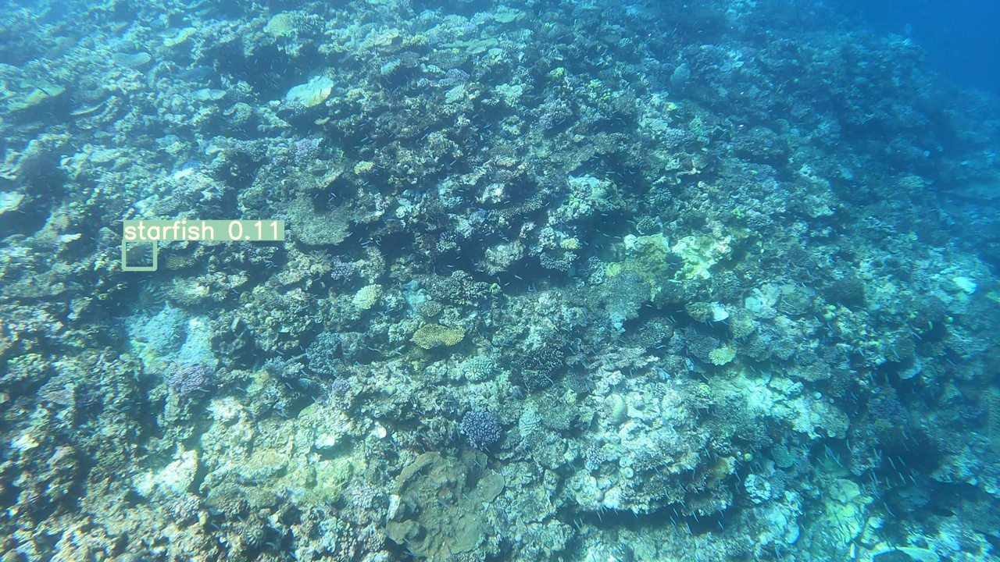

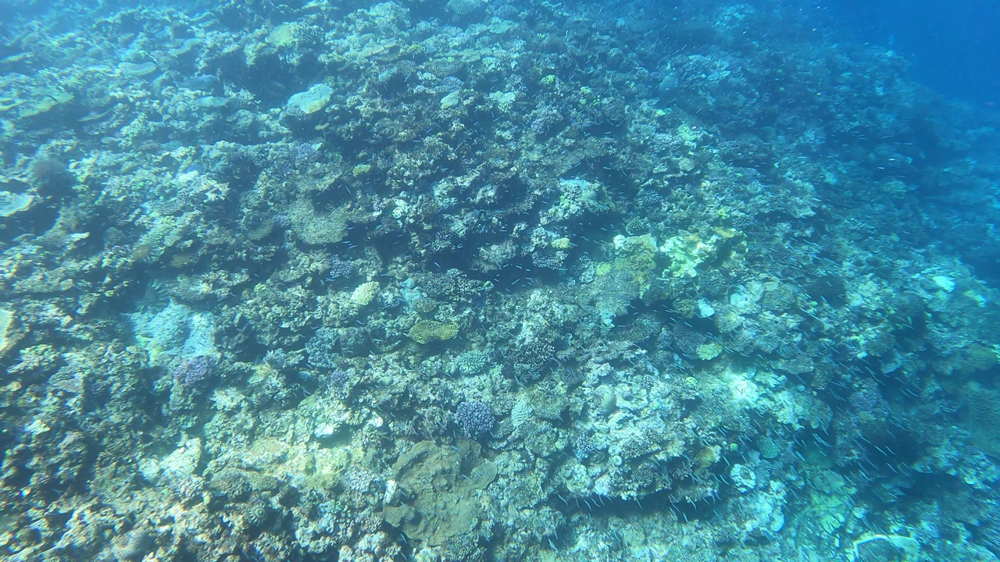

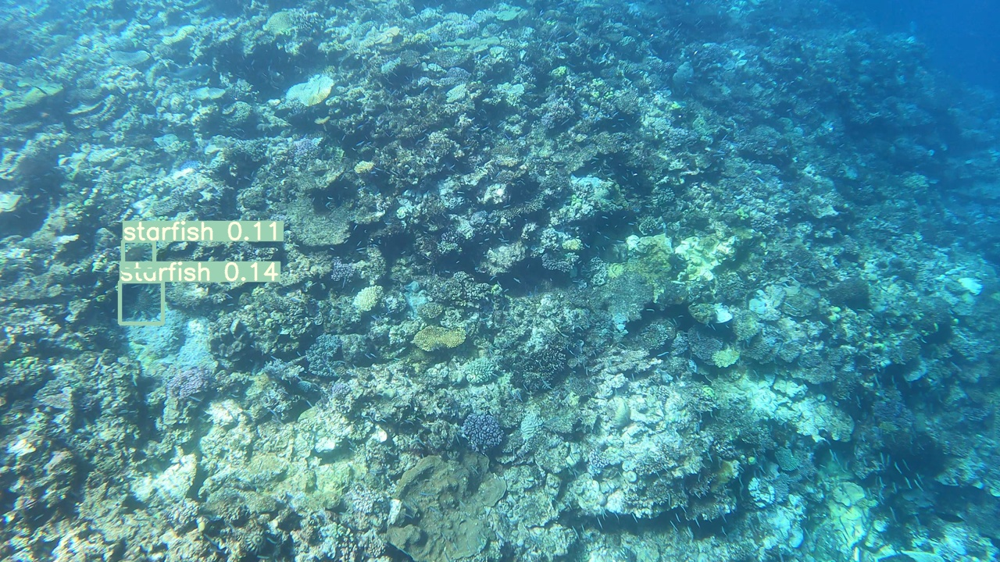

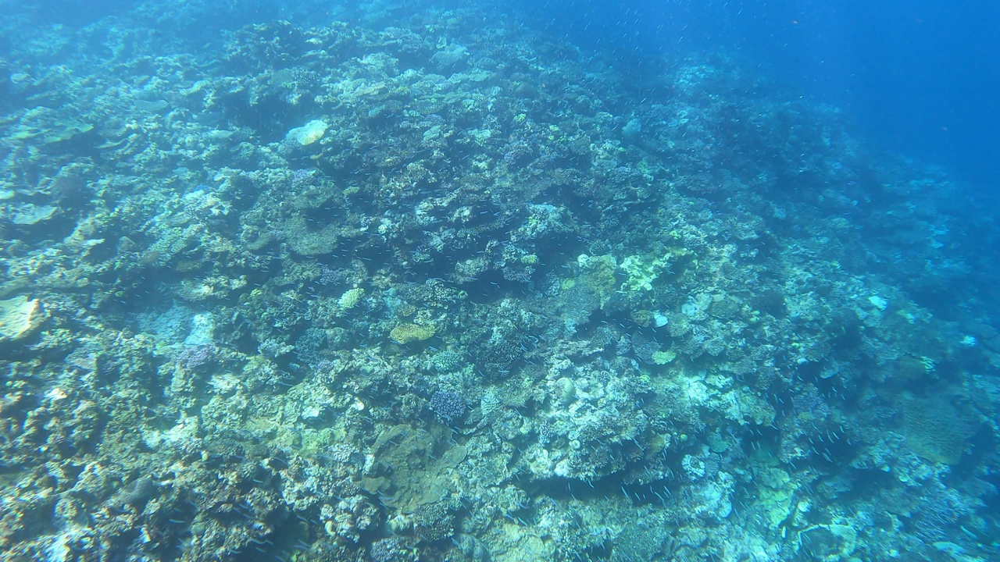

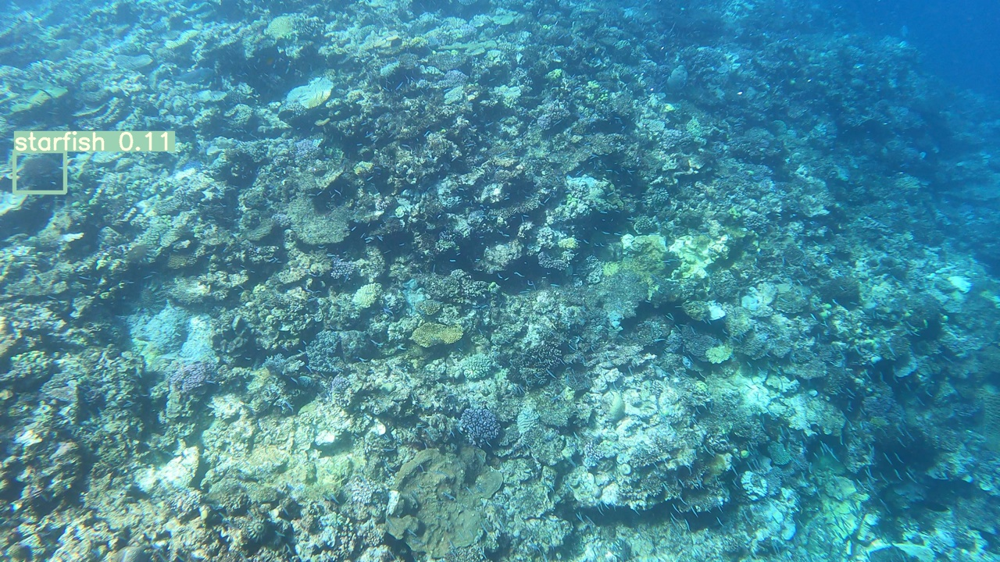

...

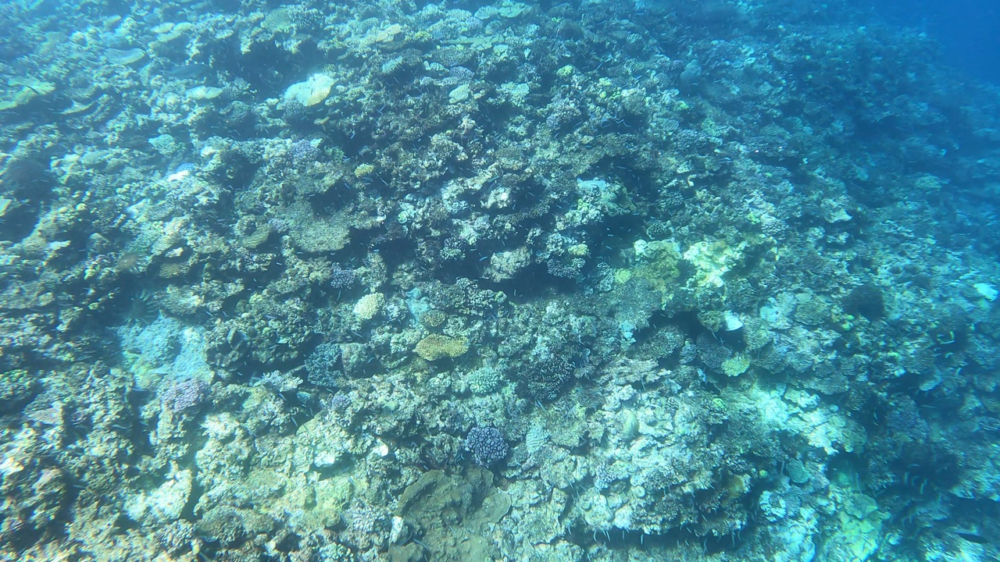

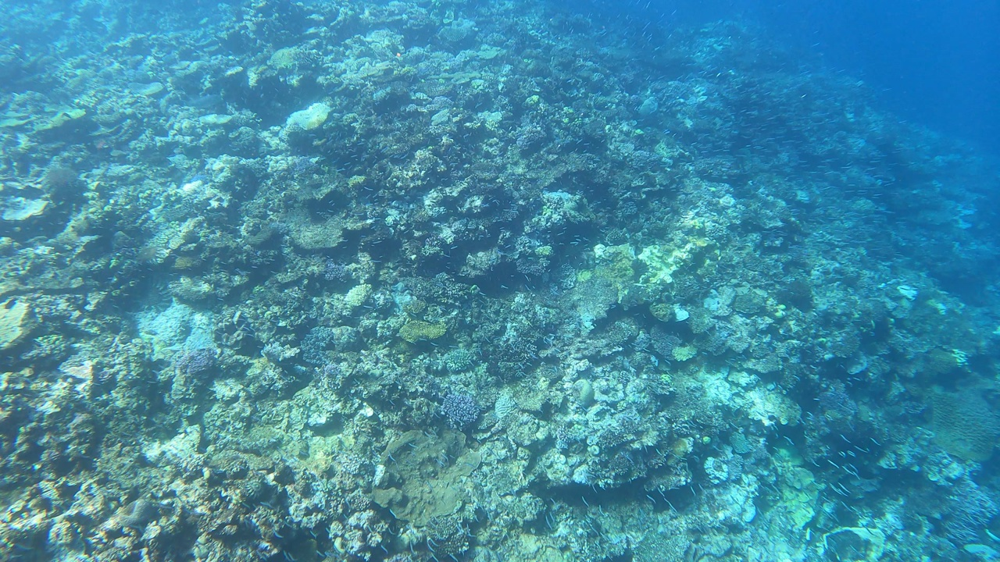

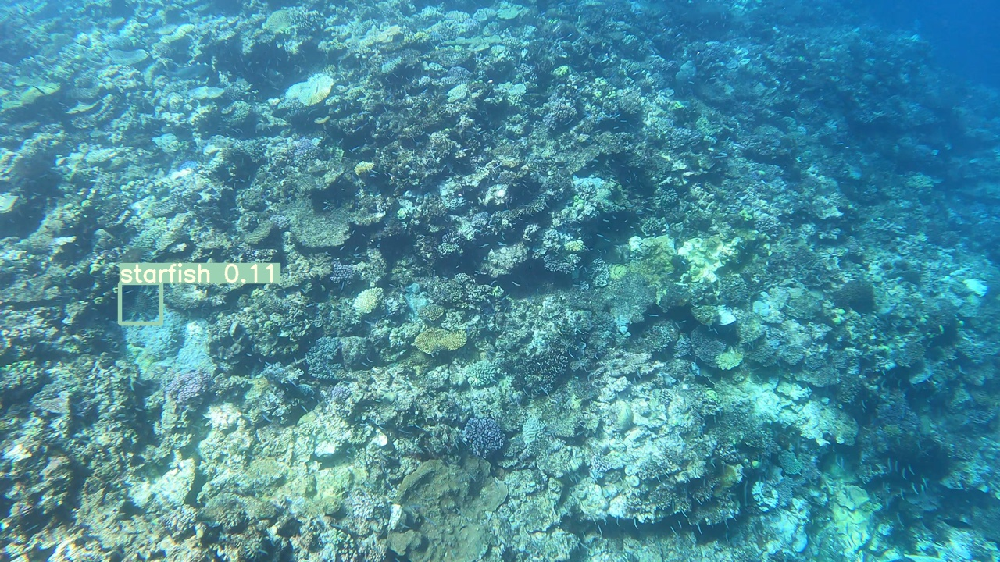

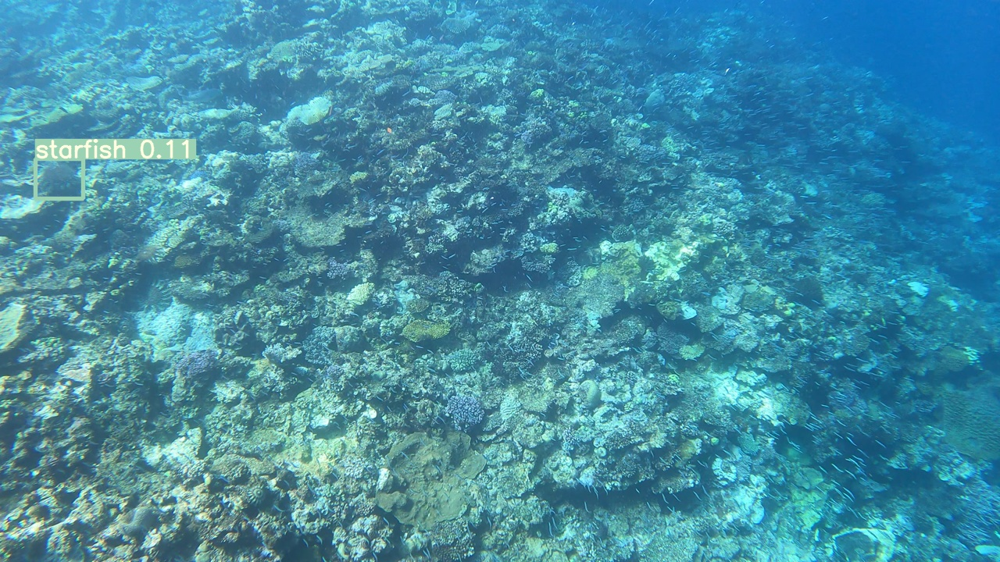

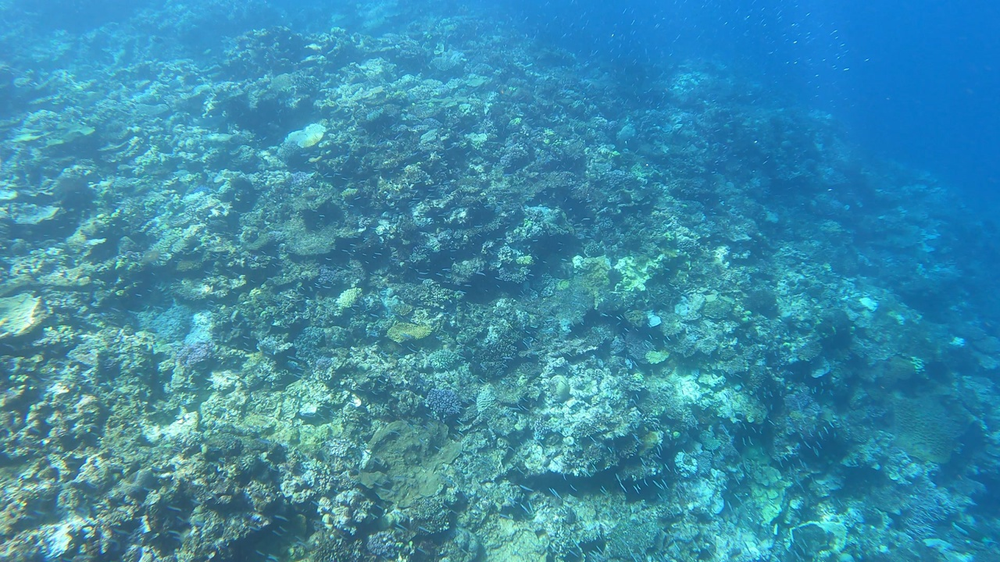

In [ ]:
for img in glob.glob('/content/yolor/inference/output/*.jpg'): 
    display(Image(filename=img))
    print("\n")

In [ ]:
! cp -rf /content/yolor/runs  /content/mydrive/MyDrive/1231_yolor/